In [5]:
if not "__WDSET__" in globals():
    %cd -q ..
    __WDSET__ = True

In [6]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [7]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

In [8]:
from wsfr_read.streamflow import read_usgs_streamflow_data, read_test_monthly_naturalized_flow
from wsfr_read.climate.cpc_outlooks import read_cpc_outlooks_precip, read_cpc_outlooks_temp
from wsfr_read.teleconnections import read_mjo_data, read_nino_regions_sst_data, read_oni_data, read_pdo_data, read_pna_data, read_soi_data
from wsfr_read.sites import read_metadata, read_geospatial

2023-12-14 19:40:14.624 | INFO     | wsfr_read.config:<module>:10 - DATA_ROOT is /Users/nsarang/Nimas/water-supply-forecast-rodeo-runtime/data


# Metadata

In [9]:
metadata = read_metadata()
metadata

,season_start_month,season_end_month,elevation,latitude,longitude,drainage_area,usgs_id,usgs_name,nrcs_id,nrcs_name,rfc_id,rfc_name,rfc
site_id,,,,,,,,,,,,,
hungry_horse_reservoir_inflow,4,7,3040.00,48.356630,-114.037620,1668.0,12362500,S F Flathead River nr Columbia Falls MT,12362500:MT:USGS,Hungry Horse Reservoir Inflow,HHWM8,SF Flathead - Hungry Horse Dam,NWRFC
snake_r_nr_heise,4,7,5015.00,43.612500,-111.660000,5752.0,13037500,Snake River NR Heise ID,13037500:ID:USGS,Snake R nr Heise,HEII1,Snake - Near Heise,NWRFC
pueblo_reservoir_inflow,4,7,4740.00,38.271670,-104.718030,4670.0,07099400,Arkansas River above Pueblo CO,07099400:CO:USGS,Pueblo Reservoir Inflow,PDAC2,Arkansas River Above Pueblo,ARBRFC
sweetwater_r_nr_alcova,4,7,5890.00,42.489960,-107.133940,2338.0,06639000,"Sweetwater River Near Alcova, WY",06639000:WY:USGS,Sweetwater R nr Alcova,NaN,NaN,NaN
missouri_r_at_toston,4,7,3906.00,46.146040,-111.420520,14641.0,06054500,Missouri River at Toston MT,06054500:MT:USGS,Missouri R at Toston,TOSM8,Missouri River at Toston,MBRFC
animas_r_at_durango,4,7,6502.00,37.279170,-107.880340,701.0,09361500,"Animas River at Durango, CO",09361500:CO:USGS,Animas R at Durango,DRGC2,Animas - Durango,CBRFC
yampa_r_nr_maybell,4,7,5900.00,40.502750,-108.033420,3383.0,09251000,"Yampa River Near Maybell, CO",09251000:CO:USGS,Yampa R nr Maybell,MBLC2,Yampa - Maybell Nr,CBRFC
libby_reservoir_inflow,4,7,2100.00,48.400790,-115.320720,8999.0,12301933,Kootenai River BL Libby Dam NR Libby MT,12301933:MT:USGS,Libby Reservoir Inflow,LYDM8,Kootenai - Libby Dam,NWRFC
boise_r_nr_boise,4,7,2827.00,43.527670,-116.059550,2686.0,13202000,Boise River NR Boise ID,13202000:ID:USGS,Boise R nr Boise,LUCI1,Boise - Lucky Peak Dam,NWRFC


In [10]:
metadata.reset_index().groupby(["season_start_month", "season_end_month"])["site_id"].agg(['count', 'unique'])

count  \
season_start_month season_end_month          
3                  7                     1   
4                  6                     1   
                   7                    24   

                                                                                unique  
season_start_month season_end_month                                                     
3                  7                                                [pecos_r_nr_pecos]  
4                  6                                             [detroit_lake_inflow]  
                   7                 [hungry_horse_reservoir_inflow, snake_r_nr_hei...

# Naturalzied Flow 

## Test

In [8]:
test_monthly_naturalized_flow = read_test_monthly_naturalized_flow(
    site_id="snake_r_nr_heise", issue_date="2017-02-15"
)  # reads from `test_monthly_naturalized_flow.csv`
test_monthly_naturalized_flow

volume
year month         
2016 10     309.892
     11     259.003
     12     210.436
2017 1      197.631

In [112]:
df_test = df_train = pd.read_csv("data/test_monthly_naturalized_flow.csv")
df_test.groupby("site_id").apply(lambda x: x.isnull().mean())

,site_id,forecast_year,year,month,volume
site_id,,,,,
animas_r_at_durango,0.0,0.0,0.0,0.0,0.000000
boise_r_nr_boise,0.0,0.0,0.0,0.0,0.000000
boysen_reservoir_inflow,0.0,0.0,0.0,0.0,0.000000
colville_r_at_kettle_falls,0.0,0.0,0.0,0.0,0.000000
detroit_lake_inflow,0.0,0.0,0.0,0.0,0.000000
dillon_reservoir_inflow,0.0,0.0,0.0,0.0,0.000000
fontenelle_reservoir_inflow,0.0,0.0,0.0,0.0,0.000000
green_r_bl_howard_a_hanson_dam,0.0,0.0,0.0,0.0,0.000000
hungry_horse_reservoir_inflow,0.0,0.0,0.0,0.0,0.000000


In [115]:
df_test.query("site_id == 'sweetwater_r_nr_alcova'").groupby("forecast_year").apply(lambda x: x.isnull().mean())

,site_id,forecast_year,year,month,volume
forecast_year,,,,,
2005,0.0,0.0,0.0,0.0,0.666667
2007,0.0,0.0,0.0,0.0,0.666667
2009,0.0,0.0,0.0,0.0,0.666667
2011,0.0,0.0,0.0,0.0,0.666667
2013,0.0,0.0,0.0,0.0,0.555556
2015,0.0,0.0,0.0,0.0,0.555556
2017,0.0,0.0,0.0,0.0,0.444444
2019,0.0,0.0,0.0,0.0,0.111111
2021,0.0,0.0,0.0,0.0,0.000000


# Train

In [78]:
from wsfr_read.config import DATA_ROOT

train_monthly_naturalized_flow = read_test_monthly_naturalized_flow(
    site_id="snake_r_nr_heise",
    issue_date="2018-09-15",
    filepath=DATA_ROOT / "train_monthly_naturalized_flow.csv"

)
train_monthly_naturalized_flow

volume
year month          
2017 10      297.101
     11      294.082
     12      241.901
2018 1       224.620
     2       200.248
     3       249.125
     4       586.695
     5      1706.211
     6      1389.431

In [104]:
targets = pd.read_csv(DATA_ROOT / "train.csv")
targets.query("site_id == 'detroit_lake_inflow' & year == 2018")
targets

,site_id,year,volume
0,hungry_horse_reservoir_inflow,1911,2178.526
1,hungry_horse_reservoir_inflow,1912,1973.732
2,hungry_horse_reservoir_inflow,1913,3220.839
3,hungry_horse_reservoir_inflow,1914,NaN
4,hungry_horse_reservoir_inflow,1915,NaN
...,...,...,...
2172,owyhee_r_bl_owyhee_dam,2014,69.818
2173,owyhee_r_bl_owyhee_dam,2016,213.150
2174,owyhee_r_bl_owyhee_dam,2018,118.743
2175,owyhee_r_bl_owyhee_dam,2020,180.786


In [116]:
targets.isnull().mean()

site_id    0.000000
year       0.000000
volume     0.093248
dtype: float64

In [117]:
targets.groupby("site_id").apply(lambda x: x.isnull().mean())

,site_id,year,volume
site_id,,,
american_river_folsom_lake,0.0,0.0,0.000000
animas_r_at_durango,0.0,0.0,0.120690
boise_r_nr_boise,0.0,0.0,0.042017
boysen_reservoir_inflow,0.0,0.0,0.015873
colville_r_at_kettle_falls,0.0,0.0,0.000000
detroit_lake_inflow,0.0,0.0,0.600000
dillon_reservoir_inflow,0.0,0.0,0.000000
fontenelle_reservoir_inflow,0.0,0.0,0.142857
green_r_bl_howard_a_hanson_dam,0.0,0.0,0.000000


In [37]:
import pandas as pd

df_train = pd.read_csv("data/train_monthly_naturalized_flow.csv")
df_train_sample = df_train.query("site_id == 'weber_r_nr_oakley' & forecast_year >= 2000")
df_train_sample

,site_id,forecast_year,year,month,volume
11377,weber_r_nr_oakley,2000,1999,10,4.951
11378,weber_r_nr_oakley,2000,1999,11,3.979
11379,weber_r_nr_oakley,2000,1999,12,3.841
11380,weber_r_nr_oakley,2000,2000,1,2.901
11381,weber_r_nr_oakley,2000,2000,2,2.973
...,...,...,...,...,...
11498,weber_r_nr_oakley,2022,2022,2,2.721
11499,weber_r_nr_oakley,2022,2022,3,4.378
11500,weber_r_nr_oakley,2022,2022,4,10.162
11501,weber_r_nr_oakley,2022,2022,5,41.614


In [38]:
import plotly.graph_objects as go

df_ = df_train_sample.copy()

# Convert 'Month' to a numerical format if it's not already (e.g., Oct=10, Nov=11, ..., Jun=6)
month_mapping = {'October': 10, 'November': 11, 'December': 12, 'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6}
df_['month'] = df_['month'].map({v:k for k,v in month_mapping.items()})

# Create a pivot table for plotting
pivot_df = df_.pivot(index='forecast_year', columns='month', values='volume')[list(month_mapping.keys())]

# Use Plotly to create an interactive plot
fig = go.Figure(data=[go.Surface(z=pivot_df.values, x=pivot_df.columns, y=pivot_df.index)])

fig.update_layout(title='Streamflow Data',
                  autosize=False,
                  width=800,
                  height=500,
                  scene=dict(
                      aspectmode='manual',
                      aspectratio=dict(x=1, y=1, z=1),
                      yaxis=dict(autorange='reversed'),
                      xaxis_title='Month',
                      yaxis_title='Year',
                      zaxis_title='Streamflow Volume'),
                  margin=dict(l=40, r=40, b=40, t=40)
                )

# Show the plot
fig.show()


# USGS

In [36]:
site_usgs_streamflow_data = read_usgs_streamflow_data(
    site_id="snake_r_nr_heise", issue_date="2017-02-15"
)
site_usgs_streamflow_data


CUBIC_FEET_OVER_ACRE_FEET = 43559.9

monthl_sum = (
    site_usgs_streamflow_data.groupby(site_usgs_streamflow_data["datetime"].dt.month)["discharge_cfs_mean"].sum()
    .reindex(site_usgs_streamflow_data["datetime"].dt.month.unique())
)
monthl_sum * (24 * 3600) / CUBIC_FEET_OVER_ACRE_FEET / 1000

datetime
10    247.517924
11     94.948978
12     91.279548
1      90.922523
2      45.500931
Name: discharge_cfs_mean, dtype: float64

# CPC Seasonal

In [ ]:
"""
Read CPC Seasonal Precipitation Outlooks available as of a given issue_date.

Description
The tables give the estimated high frequency skill (skill in predicting the year to year variations), the mean, standard deviation, and the exceedence threshold values for given probability levels. (98,95,90,80,70,60,50,40,30,20,10,5, and 2 percentile levels).

Derivation
These data are derived from the outlooks issued monthly by CPC, together with an estimate of their skill obtained from the tools used for the prediction.

Contents
The forecasts issued on a particular month are grouped together. There are 2 header records followed by multiple data records (Rows) per monthly forecast. Forecasts are for three month target seasons, defined by forecast issue time and lead.
The first line on the header record gives the month, day and year (mmdd yyyy) of forecast issue time, followed by the number of groups and the number of forecast locations in each group. The final number is a forecast type id flag. 950 is a number assigned to identify seasonal temperature forecasts. 951 identifies seasonal precipitation forecasts.
The second header label gives column definitions. Each forecast issue time has its own 2 line header record


Column:	label:	Definition
1-2:	year mn	Year and month number that forecast was issued. 1=Jan, 2=Feb. Forecasts are issued around mid-month.
3:	lead	Approximate lead time of forecast in months - rounded upward, An actual lead time of about one-half month (the shortest lead on the outlooks) is rounded to lead=1, for example. The valid target season can be found by adding lead months to the initial time listed in column 1 and 2, adjusting for year changes.
4:	cd:	The forecast location to which data apply. See regdict.txt for definitions.
5:	r:	The correlation skill estimate of this forecast. These are approximate high frequency (year-to-year) correlations, and are not accurate for measuring the trend skill. The actual forecast (including trend prediction) is more skillful than this value indicates.
6-18:	98,95,90,etc	Temperatures expected (Forecast) to be exceeded by the percent of time listed in the column label.
19:	F mean:	The forecast mean value for the target period.
20:	C mean:	The climatological mean value.
21:	F sd	Forecast standard deviation. Temperatures are assumed normal, however precipitation is transformed by a power transformation (See col. 23). These columns give the values of the transformed precipitation units and are not in inches!!!! The precipitaion must be transformed before these values can be used
22:	c sd	Climatological expected value. See important note on column 21description above for Precipitation files.
23:	power	(Precipitation only) The power transformation value is stored here. The transformed variable, is (precip)**power Where **power indicates raised to the power of the value found in column 23. The transformed variable is approximately Gaussian with mean = median of untransformed variable (col. 12) and standard deviation in transformed units given in columns 21 and 22.

The final line in the data set is denoted by a 9999 in the years position - followed by the data set name of the cd location dictionary file.

Data Set Use
These data are designed to be used in quantitative analysis of CPC forecasts. The forecasts are only estimates of the distribution implied by the long lead outlooks and are derived from the tercile probability anomalies (Forecasts for above, near, and below median). The distribution is most accurate in the vicinity of these tercile boundaries (33 and 66 percent probability of exceedence). Particular caution should be used in the interpretation probabilities below about 10% or above 90%.
"""

In [7]:
"Forecasts are for three month target seasons, defined by forecast issue time and lead, i.e start month = issue data + lead"
cpc_outlooks_precip = read_cpc_outlooks_precip(issue_date="2021-03-15", site_id=None) # reads from `cpc_outlooks`
cpc_outlooks_precip

R   98.   95.   90.   80.    70.    60.    50.  \
issue_date YEAR MN LEAD CD                                                      
2020-11-18 2020 10 1    1    0.0  5.74  6.47  7.13  7.99   8.63   9.19   9.72   
                        2    0.0  7.01  7.89  8.71  9.75  10.54  11.22  11.87   
                        3    0.0  6.74  7.35  7.91  8.62   9.16   9.62  10.06   
                        4    0.0  6.71  7.62  8.45  9.49  10.26  10.93  11.55   
                        5    0.0  6.14  6.75  7.30  7.99   8.50   8.93   9.33   
...                          ...   ...   ...   ...   ...    ...    ...    ...   
2021-02-17 2021 1  13   98   0.0  0.40  0.63  0.88  1.26   1.58   1.88   2.18   
                        99   0.0  0.86  1.23  1.56  1.96   2.26   2.52   2.75   
                        100  0.0  0.40  0.56  0.75  1.03   1.28   1.53   1.79   
                        101  0.0  0.49  0.66  0.84  1.10   1.33   1.55   1.77   
                        102  0.0  0.25  0.37  0.50  0.70   0.87   1.04   1.22   

                               40.    30.    20.    10.     5.     2.  F MEAN  \
issue_date YEAR MN LEAD CD                                                      
2020-11-18 2020 10 1    1    10.29  10.89  11.62  12.66  13.54  14.57    9.72   
                        2    12.57  13.30  14.20  15.47  16.54  17.80   11.87   
                        3    10.53  11.04  11.64  12.51  13.24  14.09   10.06   
                        4    12.21  12.90  13.73  14.89  15.86  16.98   11.55   
                        5     9.76  10.20  10.73  11.47  12.08  12.78    9.33   
...                            ...    ...    ...    ...    ...    ...     ...   
2021-02-17 2021 1  13   98    2.52   2.91   3.40   4.15   4.83   5.66    2.18   
                        99    3.00   3.26   3.57   3.99   4.34   4.74    2.75   
                        100   2.09   2.45   2.93   3.70   4.44   5.42    1.79   
                        101   2.02   2.31   2.69   3.29   3.84   4.54    1.77   
                        102   1.43   1.67   1.99   2.50   2.99   3.61    1.22   

                             C MEAN  F SD  C SD  POWER  
issue_date YEAR MN LEAD CD                              
2020-11-18 2020 10 1    1      9.72  0.48  0.48   0.58  
                        2     11.87  0.54  0.54   0.58  
                        3     10.06  0.27  0.27   0.49  
                        4     11.55  1.06  1.06   0.76  
                        5      9.33  0.83  0.83   0.80  
...                             ...   ...   ...    ...  
2021-02-17 2021 1  13   98     2.18  0.37  0.37   0.45  
                        99     2.75  0.84  0.84   0.94  
                        100    1.79  0.17  0.17   0.24  
                        101    1.77  0.18  0.18   0.29  
                        102    1.22  0.19  0.19   0.29  

[2652 rows x 19 columns]

In [13]:
site_cpc_outlooks_precip = read_cpc_outlooks_precip(
    issue_date="2022-03-15", site_id="hungry_horse_reservoir_inflow"
)  # reads site climate divisions (CD) tag from `cpc_climate_divisions.gpkg`. A site can cover multiple CDs.
site_cpc_outlooks_precip

R   98.   95.   90.   80.   70.   60.   50.  \
issue_date YEAR MN LEAD CD                                                   
2021-11-17 2021 10 1    20  0.34  1.07  1.24  1.39  1.60  1.77  1.92  2.06   
                        21  0.37  2.41  2.75  3.08  3.52  3.87  4.18  4.48   
                   2    20  0.22  0.94  1.11  1.28  1.50  1.68  1.84  2.00   
                        21  0.22  2.20  2.53  2.83  3.23  3.53  3.79  4.05   
                   3    20  0.07  1.15  1.32  1.48  1.70  1.87  2.03  2.18   
...                          ...   ...   ...   ...   ...   ...   ...   ...   
2022-02-16 2022 1  11   21  0.00  1.93  2.24  2.53  2.92  3.21  3.47  3.72   
                   12   20  0.00  1.07  1.24  1.40  1.61  1.77  1.92  2.06   
                        21  0.00  1.99  2.25  2.49  2.81  3.06  3.28  3.49   
                   13   20  0.00  1.48  1.82  2.12  2.48  2.75  2.97  3.18   
                        21  0.00  2.20  2.47  2.71  3.03  3.28  3.49  3.70   

                             40.   30.   20.   10.    5.    2.  F MEAN  \
issue_date YEAR MN LEAD CD                                               
2021-11-17 2021 10 1    20  2.22  2.40  2.62  2.94  3.23  3.58    2.12   
                        21  4.82  5.18  5.63  6.30  6.88  7.59    4.61   
                   2    20  2.18  2.38  2.62  2.99  3.32  3.72    2.08   
                        21  4.32  4.61  4.96  5.48  5.91  6.43    4.11   
                   3    20  2.34  2.52  2.74  3.06  3.35  3.70    2.24   
...                          ...   ...   ...   ...   ...   ...     ...   
2022-02-16 2022 1  11   21  3.99  4.27  4.63  5.13  5.57  6.08    3.72   
                   12   20  2.22  2.39  2.61  2.92  3.20  3.54    2.06   
                        21  3.72  3.98  4.29  4.74  5.14  5.61    3.49   
                   13   20  3.39  3.61  3.87  4.24  4.53  4.87    3.18   
                        21  3.92  4.16  4.46  4.89  5.25  5.69    3.70   

                            C MEAN    F SD  C SD  POWER  
issue_date YEAR MN LEAD CD                               
2021-11-17 2021 10 1    20    1.88  0.1036  0.11   0.29  
                        21    4.04  0.1303  0.14   0.30  
                   2    20    1.82  0.1169  0.12   0.29  
                        21    3.72  0.2733  0.28   0.52  
                   3    20    2.06  0.1197  0.12   0.33  
...                            ...     ...   ...    ...  
2022-02-16 2022 1  11   21    3.72  0.2800  0.28   0.52  
                   12   20    2.06  0.1200  0.12   0.33  
                        21    3.49  0.1300  0.13   0.34  
                   13   20    3.18  0.8600  0.86   1.02  
                        21    3.70  0.1600  0.16   0.41  

[78 rows x 19 columns]

In [8]:
"Read CPC Seasonal Temperature Outlooks available as of a given issue_date."
cpc_outlooks_temp = read_cpc_outlooks_temp(issue_date="2022-03-15", site_id=None) # reads from `cpc_outlooks`
cpc_outlooks_temp

R    98.    95.    90.    80.    70.    60.  \
issue_date YEAR MN LEAD CD                                                    
2021-11-17 2021 10 1    1    0.23  16.89  18.11  19.18  20.49  21.44  22.24   
                        2    0.23  23.47  24.53  25.47  26.61  27.44  28.14   
                        3    0.17  21.73  23.01  24.14  25.51  26.51  27.35   
                        4    0.10  28.67  29.79  30.78  31.99  32.87  33.61   
                        5    0.16  25.69  26.96  28.09  29.46  30.46  31.30   
...                           ...    ...    ...    ...    ...    ...    ...   
2022-02-16 2022 1  13   98   0.32  53.41  54.05  54.61  55.30  55.80  56.22   
                        99   0.00  35.72  36.30  36.82  37.45  37.91  38.29   
                        100  0.36  47.44  48.01  48.51  49.12  49.56  49.94   
                        101  0.29  42.26  42.77  43.22  43.77  44.17  44.50   
                        102  0.33  49.99  50.54  51.02  51.60  52.03  52.39   

                               50.    40.    30.    20.    10.     5.     2.  \
issue_date YEAR MN LEAD CD                                                     
2021-11-17 2021 10 1    1    22.98  23.75  24.55  25.50  26.81  27.88  29.09   
                        2    28.79  29.47  30.17  31.00  32.14  33.08  34.14   
                        3    28.13  28.94  29.79  30.78  32.16  33.28  34.56   
                        4    34.30  35.01  35.76  36.64  37.84  38.83  39.96   
                        5    32.08  32.89  33.73  34.73  36.10  37.22  38.50   
...                            ...    ...    ...    ...    ...    ...    ...   
2022-02-16 2022 1  13   98   56.61  57.02  57.44  57.94  58.63  59.19  59.84   
                        99   38.65  39.02  39.41  39.87  40.49  41.01  41.60   
                        100  50.28  50.65  51.02  51.46  52.07  52.57  53.14   
                        101  44.81  45.14  45.47  45.87  46.42  46.87  47.38   
                        102  52.72  53.07  53.43  53.86  54.44  54.92  55.47   

                             F MEAN  C MEAN    F SD  C SD  
issue_date YEAR MN LEAD CD                                 
2021-11-17 2021 10 1    1     22.98   21.97  2.9682  3.05  
                        2     28.79   27.87  2.5973  2.67  
                        3     28.13   27.26  3.1216  3.17  
                        4     34.30   33.38  2.7473  2.76  
                        5     32.08   31.37  3.1186  3.16  
...                             ...     ...     ...   ...  
2022-02-16 2022 1  13   98    56.61   56.13  1.5646  1.65  
                        99    38.65   38.65  1.4300  1.43  
                        100   50.28   50.23  1.3878  1.49  
                        101   44.81   44.75  1.2457  1.30  
                        102   52.72   52.58  1.3327  1.41  

[3978 rows x 18 columns]

# MJO

In [10]:
"""Loads the Madden-Julian Oscillation index data appropriately subset for issue_date."""
mjo_data = read_mjo_data(issue_date="2022-03-01")
mjo_data

,DATE,INDEX_9,INDEX_10,INDEX_1,INDEX_2,INDEX_3,INDEX_4,INDEX_5,INDEX_6,INDEX_7,INDEX_8
0,1978-01-03,0.38,1.01,1.28,0.73,0.54,-0.16,-0.77,-1.22,-1.09,-0.34
1,1978-01-08,-0.99,-0.27,0.82,1.39,1.34,1.10,0.57,-0.26,-1.18,-1.36
2,1978-01-13,-1.10,-1.17,-0.65,0.33,0.60,1.03,1.18,0.96,0.14,-0.69
3,1978-01-18,1.68,0.88,-0.67,-1.78,-1.70,-1.73,-1.25,-0.20,1.25,1.88
4,1978-01-23,2.29,2.45,1.33,-0.69,-1.12,-2.12,-2.50,-2.07,-0.37,1.40
...,...,...,...,...,...,...,...,...,...,...,...
3219,2022-02-07,-0.04,-0.84,-0.87,-1.08,-0.96,-0.45,0.45,1.02,1.09,0.80
3220,2022-02-12,-0.40,-1.40,-1.44,-1.49,-1.14,-0.29,0.93,1.52,1.42,0.84
3221,2022-02-17,-0.49,-1.35,-1.37,-1.32,-0.92,-0.12,0.95,1.39,1.23,0.65
3222,2022-02-22,-0.11,-1.74,-1.90,-2.22,-1.91,-0.87,0.95,2.08,2.19,1.56


# Nino SST

In [15]:
"""Loads the Nino Regions Sea Surface Temperature (SST) data  appropriately subset for issue_date."""
nino_regions_sst_data = read_nino_regions_sst_data(issue_date="2019-10-15")
nino_regions_sst_data

,YR,MON,NINO1+2,NINO1+2 ANOM,NINO3,NINO3 ANOM,NINO4,NINO4 ANOM,NINO3.4,NINO3.4 ANOM
0,1982,1,24.28,-0.24,25.84,0.17,28.01,-0.21,26.65,0.08
1,1982,2,25.38,-0.72,26.26,-0.11,27.99,-0.11,26.54,-0.20
2,1982,3,25.22,-1.38,26.92,-0.25,28.18,-0.05,27.09,-0.14
3,1982,4,24.57,-1.16,27.52,-0.05,28.61,0.10,27.83,0.02
4,1982,5,24.00,-0.62,27.70,0.49,29.19,0.40,28.37,0.49
...,...,...,...,...,...,...,...,...,...,...
448,2019,5,24.76,0.15,27.87,0.66,29.41,0.62,28.63,0.75
449,2019,6,23.15,-0.03,27.07,0.42,29.53,0.69,28.31,0.60
450,2019,7,21.24,-0.59,25.93,0.06,29.51,0.73,27.72,0.42
451,2019,8,20.39,-0.47,25.11,-0.11,29.31,0.62,27.05,0.15


# ONI

In [16]:
"""Loads the Oceanic Nino Index (ONI) data appropriately subset for issue_date.

The Oceanic Niño Index (ONI) values three-month running mean periods used to monitor and measure the El Niño and La Niña phenomena in the Pacific Ocean. These abbreviations are constructed from the first letter of each month in the three-month period. Understanding these periods is important for interpreting climate data related to El Niño and La Niña events, which significantly impact weather patterns globally.

Here's what each abbreviation stands for:

DJF: December - January - February
JFM: January - February - March
FMA: February - March - April
MAM: March - April - May
AMJ: April - May - June
MJJ: May - June - July
JJA: June - July - August
JAS: July - August - September
ASO: August - September - October
SON: September - October - November
OND: October - November - December
NDJ: November - December - January
These three-month periods are used in ONI because El Niño and La Niña conditions are defined based on the sea surface temperature anomalies in the Niño 3.4 region of the central Pacific Ocean over these specific intervals. By averaging over three months, short-term variations are smoothed out, providing a clearer signal of longer-term climate anomalies. The ONI value is calculated as the three-month running mean sea surface temperature anomaly for the Niño 3.4 region.

A positive ONI value (warmer than average sea surface temperatures) indicates El Niño conditions, while a negative value (cooler than average sea surface temperatures) indicates La Niña conditions. These conditions can lead to significant weather changes like altered rain patterns, droughts, floods, and even impact global temperature and atmospheric circulation patterns.

"""
oni_data = read_oni_data(issue_date="2023-03-15")
oni_data

,SEAS,YR,TOTAL,ANOM
0,DJF,1950,24.72,-1.53
1,JFM,1950,25.17,-1.34
2,FMA,1950,25.75,-1.16
3,MAM,1950,26.12,-1.18
4,AMJ,1950,26.32,-1.07
...,...,...,...,...
872,ASO,2022,25.75,-1.01
873,SON,2022,25.72,-0.99
874,OND,2022,25.76,-0.92
875,NDJ,2022,25.80,-0.82


# PDO

In [17]:
"""Loads the Pacific Decadal Oscillation (PDO) index data  appropriately subset for issue_date."""
pdo_data = read_pdo_data(issue_date="2019-02-15")
pdo_data

,year,month,pdo_index
0,1854,1,0.11
1,1854,2,-0.24
2,1854,3,-0.40
3,1854,4,-0.44
4,1854,5,-0.54
...,...,...,...
1976,2018,9,-0.35
1977,2018,10,-0.57
1978,2018,11,-0.69
1979,2018,12,-0.21


In [18]:
"""Loads the Pacific-North American (PNA) Index data  appropriately subset for issue_date."""
pna_data = read_pna_data(issue_date="2023-03-15")
pna_data

,year,month,pna_index
0,1950,1,-2.34
1,1950,2,-1.04
2,1950,3,0.24
3,1950,4,0.01
4,1950,5,-0.55
...,...,...,...
873,2022,10,0.17
874,2022,11,-0.73
875,2022,12,-0.66
876,2023,1,0.21


# SOI

In [39]:
"""Loads the Southern Oscillation Index (SOI) data  appropriately subset for issue_date."""
soi_data = read_soi_data("2023-02-15")
soi_data

,year,month,soi
0,1951,1,1.5
1,1951,2,0.9
2,1951,3,-0.1
3,1951,4,-0.3
4,1951,5,-0.7
...,...,...,...
860,2022,9,1.6
861,2022,10,1.7
862,2022,11,0.3
863,2022,12,2.1


# Basins

In [5]:
"""Load competition geospatial.gpkg file with site polygons. Valid layers are "basins" for
    drainage basin delineations or "sites" for forecast site point locations.
"""
basins_data = read_geospatial("basins")
basins_data

,site_id,name,area,geometry
0,hungry_horse_reservoir_inflow,Hungry Horse Reservoir Inflow,1681.780,"POLYGON ((-113.09701 47.24399, -113.09730 47.2..."
1,snake_r_nr_heise,Snake River near Heise,5719.410,"MULTIPOLYGON (((-110.79196 44.40127, -110.7922..."
2,pueblo_reservoir_inflow,Pueblo Reservoir Inflow,4615.460,"POLYGON ((-105.67340 38.15883, -105.67315 38.1..."
3,sweetwater_r_nr_alcova,Sweetwater River near Alcova,2377.280,"POLYGON ((-107.32822 42.21621, -107.32903 42.2..."
4,missouri_r_at_toston,Missouri River at Toston,14676.200,"POLYGON ((-110.63001 46.30856, -110.63006 46.3..."
5,animas_r_at_durango,Animas River at Durango,700.901,"POLYGON ((-107.87584 37.27614, -107.87759 37.2..."
6,yampa_r_nr_maybell,Yampa River near Maybell,3381.680,"MULTIPOLYGON (((-107.02802 40.02615, -107.0277..."
7,libby_reservoir_inflow,Libby Reservoir Inflow,9030.450,"MULTIPOLYGON (((-114.85817 48.50961, -114.8582..."
8,boise_r_nr_boise,Boise River near Boise,2687.340,"MULTIPOLYGON (((-115.23528 44.09596, -115.2355..."
9,green_r_bl_howard_a_hanson_dam,Green River below Howard Hanson Dam,221.234,"POLYGON ((-121.31474 47.13373, -121.31530 47.1..."


In [6]:
import folium
from folium import plugins

"""
Each source should contain a list with the folowing items:
(authconfig, password, referer, url, username, zmax, zmin)
"""

basemaps = {
    "Google Maps": (
       "",
       "https://mt1.google.com/vt/lyrs=m&x={x}&y={y}&z={z}",
       19,
       0
    ),
    "Google Satellite": (
        "",
        "https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
        19,
        0,
    ),
    "Google Terrain": ("", "https://mt1.google.com/vt/lyrs=t&x={x}&y={y}&z={z}", 19, 0),
    "Google Terrain Hybrid": (
        "",
        "https://mt1.google.com/vt/lyrs=p&x={x}&y={y}&z={z}",
        19,
        0,
    ),
    "Google Satellite Hybrid": (
        "",
        "https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}",
        19,
        0,
    ),
    "Stamen Terrain": (
        "Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL",
        "http://tile.stamen.com/terrain/{z}/{x}/{y}.png",
        20,
        0,
    ),
    "Stamen Toner": (
        "Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL",
        "http://tile.stamen.com/toner/{z}/{x}/{y}.png",
        20,
        0,
    ),
    "Stamen Toner Light": (
        "Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL",
        "http://tile.stamen.com/toner-lite/{z}/{x}/{y}.png",
        20,
        0,
    ),
    "Stamen Watercolor": (
        "Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL",
        "http://tile.stamen.com/watercolor/{z}/{x}/{y}.jpg",
        18,
        0,
    ),
    "Wikimedia Map": (
        "OpenStreetMap contributors, under ODbL",
        "https://maps.wikimedia.org/osm-intl/{z}/{x}/{y}.png",
        20,
        1,
    ),
    "Wikimedia Hike Bike Map": (
        "OpenStreetMap contributors, under ODbL",
        "http://tiles.wmflabs.org/hikebike/{z}/{x}/{y}.png",
        17,
        1,
    ),
    "Esri Boundaries Places": (
        "",
        "https://server.arcgisonline.com/ArcGIS/rest/services/Reference/World_Boundaries_and_Places/MapServer/tile/{z}/{y}/{x}",
        20,
        0,
    ),
    "Esri Gray (dark)": (
        "",
        "http://services.arcgisonline.com/ArcGIS/rest/services/Canvas/World_Dark_Gray_Base/MapServer/tile/{z}/{y}/{x}",
        16,
        0,
    ),
    "Esri Gray (light)": (
        "",
        "http://services.arcgisonline.com/ArcGIS/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}",
        16,
        0,
    ),
    "Esri National Geographic": (
        "",
        "http://services.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}",
        12,
        0,
    ),
    "Esri Ocean": (
        "",
        "https://services.arcgisonline.com/ArcGIS/rest/services/Ocean/World_Ocean_Base/MapServer/tile/{z}/{y}/{x}",
        10,
        0,
    ),
    "Esri Satellite": (
        "",
        "https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
        17,
        0,
    ),
    "Esri Standard": (
        "",
        "https://server.arcgisonline.com/ArcGIS/rest/services/World_Street_Map/MapServer/tile/{z}/{y}/{x}",
        17,
        0,
    ),
    "Esri Terrain": (
        "",
        "https://server.arcgisonline.com/ArcGIS/rest/services/World_Terrain_Base/MapServer/tile/{z}/{y}/{x}",
        13,
        0,
    ),
    "Esri Transportation": (
        "",
        "https://server.arcgisonline.com/ArcGIS/rest/services/Reference/World_Transportation/MapServer/tile/{z}/{y}/{x}",
        20,
        0,
    ),
    "Esri Topo World": (
        "",
        "http://services.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}",
        20,
        0,
    ),
    "OpenStreetMap Standard": (
        "OpenStreetMap contributors, CC-BY-SA",
        "http://tile.openstreetmap.org/{z}/{x}/{y}.png",
        19,
        0,
    ),
    "OpenStreetMap H.O.T.": (
        "OpenStreetMap contributors, CC-BY-SA",
        "http://tile.openstreetmap.fr/hot/{z}/{x}/{y}.png",
        19,
        0,
    ),
    "OpenStreetMap Monochrome": (
        "OpenStreetMap contributors, CC-BY-SA",
        "http://tiles.wmflabs.org/bw-mapnik/{z}/{x}/{y}.png",
        19,
        0,
    ),
    "Strava All": (
        "OpenStreetMap contributors, CC-BY-SA",
        "https://heatmap-external-b.strava.com/tiles/all/bluered/{z}/{x}/{y}.png",
        15,
        0,
    ),
    "Strava Run": (
        "OpenStreetMap contributors, CC-BY-SA",
        "https://heatmap-external-b.strava.com/tiles/run/bluered/{z}/{x}/{y}.png?v=19",
        15,
        0,
    ),
    "Open Weather Map Temperature": (
        "Map tiles by OpenWeatherMap, under CC BY-SA 4.0",
        "https://tile.openweathermap.org/map/temp_new/{z}/{x}/{y}.png?appid=ab6dabaca26657119d4cfa0ca772cef3",
        19,
        0,
    ),
    "Open Weather Map Clouds": (
        "Map tiles by OpenWeatherMap, under CC BY-SA 4.0",
        "http://tile.openweathermap.org/map/clouds_new/{z}/{x}/{y}.png?APPID=ab6dabaca26657119d4cfa0ca772cef3",
        19,
        0,
    ),
    "Open Weather Map Wind Speed": (
        "Map tiles by OpenWeatherMap, under CC BY-SA 4.0",
        "http://tile.openweathermap.org/map/wind_new/{z}/{x}/{y}.png?APPID=ab6dabaca26657119d4cfa0ca772cef3",
        19,
        0,
    ),
    "CartoDb Dark Matter": (
        "Map tiles by CartoDB, under CC BY 3.0. Data by OpenStreetMap, under ODbL.",
        "http://basemaps.cartocdn.com/dark_all/{z}/{x}/{y}.png",
        20,
        0,
    ),
    "CartoDb Positron": (
        "Map tiles by CartoDB, under CC BY 3.0. Data by OpenStreetMap, under ODbL.",
        "http://basemaps.cartocdn.com/light_all/{z}/{x}/{y}.png",
        20,
        0,
    ),
    "Bing VirtualEarth": (
        "",
        "http://ecn.t3.tiles.virtualearth.net/tiles/a{q}.jpeg?g=1",
        19,
        1,
    ),
}

def add_tiles(map, names):
    for tile in names:
        referer, url, zmax, zmin = basemaps[tile]
        attr = tile.split()[0]

        folium.TileLayer(
            tiles=url, attr=attr, name=tile, overlay=True, control=True, show=False
        ).add_to(map)

In [73]:
gdf = basins_data["geometry"]
geojson_data = gdf.to_json()
center = [gdf.geometry.iloc[0].centroid.y, gdf.geometry.iloc[0].centroid.x]
m = folium.Map(location=center, zoom_start=5)  # Adjust zoom level as needed

add_tiles(
    m,
    [
        "Google Maps",
        "Google Satellite",
        "Google Satellite Hybrid",
        "Esri Standard",
        "Esri Satellite",
        "Open Weather Map Temperature",
        "Open Weather Map Clouds",
    ],
)

# folium.GeoJson(geojson_data, name="Basins").add_to(m)
def get_color(cmap_name, idx, total, start=0.5, stop=1):
    cmap = mpl.colormaps.get_cmap(cmap_name)
    return mpl.colors.to_hex(cmap(np.linspace(start, stop, total)[idx]))

for idx, row in basins_data.iterrows():
    # Get color from the color map
    color = get_color("Blues", idx, total=len(basins_data), start=0.3, stop=1)
    
    # Assuming the site name is in a column called 'site_name'
    popup_text = f"{row['name']} ({row['site_id']})"
    # Create a popup with the site name
    popup = folium.Popup(popup_text, parse_html=True)
    
    # Create a GeoJson object for the polygon and add it to the map
    geojson = folium.GeoJson(row['geometry'], name="Basins", style_function=lambda x, color=color: {'fillColor': color, 'color': color})
    geojson.add_child(popup)
    geojson.add_to(m)

folium.LayerControl().add_to(m)
plugins.Fullscreen().add_to(m)
m

In [103]:
# basins_data["geometry"].to_crs(basins_data["geometry"].estimate_utm_crs()).area / 1e6 
basins_data["geometry"].to_crs("EPSG:5070").area / 1e6 

0      4355.804019
1     14813.245424
2     11954.058600
3      6157.152656
4     38011.451435
5      1815.314245
6      8758.541848
7     23388.826750
8      6960.203947
9       572.995683
10      658.931760
11      850.627252
12      579.490580
13    10875.754493
14      420.691219
15     4886.649208
16      833.606904
17     4344.770012
18     2813.371327
19      827.929863
20     1171.677828
21     2455.419921
22     2073.935320
23    19960.037285
24      445.063778
25    30198.888691
dtype: float64

In [21]:
sites_data = read_geospatial("sites") # same data as in metadata.csv
sites_data

,site_id,name,geometry
0,hungry_horse_reservoir_inflow,Hungry Horse Reservoir Inflow,POINT (-114.03786 48.35658)
1,snake_r_nr_heise,Snake River near Heise,POINT (-111.66000 43.61250)
2,pueblo_reservoir_inflow,Pueblo Reservoir Inflow,POINT (-104.71803 38.27167)
3,sweetwater_r_nr_alcova,Sweetwater River near Alcova,POINT (-107.13394 42.48996)
4,missouri_r_at_toston,Missouri River at Toston,POINT (-111.42028 46.14657)
5,animas_r_at_durango,Animas River at Durango,POINT (-107.88035 37.27917)
6,yampa_r_nr_maybell,Yampa River near Maybell,POINT (-108.03341 40.50275)
7,libby_reservoir_inflow,Libby Reservoir Inflow,POINT (-115.31872 48.40066)
8,boise_r_nr_boise,Boise River near Boise,POINT (-116.05955 43.52767)
9,green_r_bl_howard_a_hanson_dam,Green River below Howard Hanson Dam,POINT (-121.79789 47.28371)


# PDSI

In [11]:
from netCDF4 import Dataset
pdsi_data = Dataset("data/pdsi/FY2022/pdsi_2021-10-01_2022-07-21.nc", mode="r")
pdsi_data

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_CLASSIC data model, file format NETCDF3):
    geospatial_bounds_crs: EPSG:4326
    Conventions: CF-1.0
    geospatial_bounds: POLYGON((-124.7666666333333 49.400000000000000, -124.7666666333333 25.066666666666666, -67.058333300000015 25.066666666666666, -67.058333300000015 49.400000000000000, -124.7666666333333 49.400000000000000))
    geospatial_lat_min: 25.066666666666666
    geospatial_lat_max: 49.400000000000006
    geospatial_lon_min: -124.76666663333334
    geospatial_lon_max: -67.05833330000002
    geospatial_lon_resolution: 0.041666666666666
    geospatial_lat_resolution: 0.041666666666666
    geospatial_lat_units: decimal_degrees north
    geospatial_lon_units: decimal_degrees east
    coordinate_system: EPSG:4326
    author: John Abatzoglou - University of Idaho, jabatzoglou@uidaho.edu
    date: 06 December 2023
    note1: The projection information for this file is: GCS WGS 1984.
    baseperiod: 1980-2019 base period.
   

In [12]:
print(pdsi_data.variables.keys())  # Lists available variables in the dataset

dict_keys(['daily_mean_palmer_drought_severity_index', 'day', 'lat', 'lon'])


In [24]:
for i in range(num_days):
    print(pdsi_data['daily_mean_palmer_drought_severity_index'][i, :, :].max())

11.95
12.400000000000002
12.71
12.66
12.43
12.29
12.11
11.870000000000001
11.66
11.440000000000001
11.21
10.940000000000001
10.670000000000002
10.400000000000002
10.14
9.879999999999999
9.629999999999999
9.370000000000001
9.080000000000002
8.8
8.64
8.530000000000001
8.39
8.240000000000002
8.32
8.39
8.41
8.440000000000001
8.43
8.440000000000001
8.400000000000002
8.36
8.240000000000002
8.09
8.059999999999999
7.890000000000001
7.760000000000002
7.670000000000002
7.550000000000001
7.580000000000002
7.66
7.740000000000002
7.710000000000001
7.650000000000002
7.59
8.18
8.719999999999999
9.29
9.84
10.23
10.240000000000002
10.25
10.36
10.530000000000001
10.719999999999999
10.920000000000002
11.129999999999999
11.23
11.36


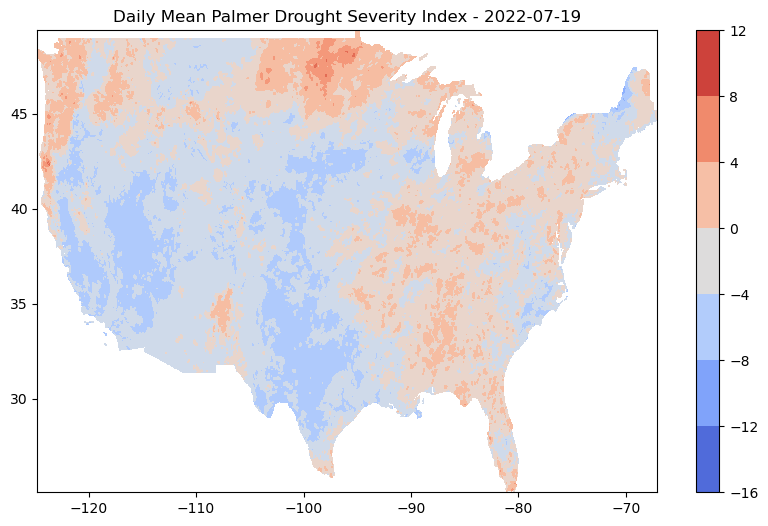

In [25]:
def init():
    global cb  # Colorbar reference
    pdsi_day = pdsi_data['daily_mean_palmer_drought_severity_index'][0, :, :]
    cont = plt.contourf(lon, lat, pdsi_day, cmap='coolwarm')
    if not cb:
        cb = plt.colorbar(cont, ax=ax, orientation='vertical')
    return cont,


def animate(day):
    ax.clear()
    pdsi_day = pdsi_data['daily_mean_palmer_drought_severity_index'][day, :, :]
    date = (datetime.fromisoformat("1900-01-01") + timedelta(days=pdsi_data["day"][day].item())).strftime("%Y-%m-%d")
    cont = plt.contourf(lon, lat, pdsi_day, cmap='coolwarm', vmin=-15, vmax=15)
    ax.set_title(f'Daily Mean Palmer Drought Severity Index - {date}')
    return cont,

fig, ax = plt.subplots(figsize=(10, 6))
cb = None  # Colorbar placeholder

# Assuming 'lon' and 'lat' are 1D arrays
lon, lat = np.meshgrid(pdsi_data['lon'][:], pdsi_data['lat'][:])

num_days = pdsi_data['daily_mean_palmer_drought_severity_index'].shape[0]
ani = FuncAnimation(fig, animate, frames=num_days, init_func=init, blit=True)

from IPython.display import HTML
HTML(ani.to_html5_video())

# GRACE Indicators

In [108]:
import netCDF4 as nc4
# grace_data = nc4.Dataset("data/grace_indicators/FY2004/GRACEDADM_CLSM0125US_7D.A20040705.030.nc4", mode="r")
grace_data = nc4.Dataset("data/grace_indicators/FY2004/GRACEDADM_CLSM0125US_7D.A20040712.030.nc4", mode="r")

grace_data

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    missing_value: -999.0
    title: GRACE Data Assimilation Drought Indicator
    version: 030
    input: CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_20
    institution: NASA GSFC HSL
    source: Catchment
    history: created on date: 2019-12-09T12:33:42.631
    references: Houborg_etal_WRR_2012, Zaitchik_etal_JHM_2008
    conventions: CF-1.6
    comment: website: http://drought.unl.edu/MonitoringTools/NASAGRACEDataAssimilation.aspx
    MAP_PROJECTION: EQUIDISTANT CYLINDRICAL
    SOUTH_WEST_CORNER_LAT: 25.0625
    SOUTH_WEST_CORNER_LON: -124.9375
    DX: 0.125
    DY: 0.125
    dimensions(sizes): lon(464), lat(224), time(1)
    variables(dimensions): float32 lat(lat), float32 lon(lon), float64 time(time), float32 gws_inst(time, lat, lon), float32 rtzsm_inst(time, lat, lon), float32 sfsm_inst(time, lat, lon)
    groups: 

In [109]:
"""
+ `gws_inst` (Groundwater Storage Instantaneous): This variable represents the instantaneous measurement of groundwater storage. It provides information about the percentile of water stored underground.
+ `rtzsm_inst` (Root Zone Soil Moisture Instantaneous): This is a measure of the soil moisture in the root zone (where most plant roots are). Like gws_inst, it's a 3D array over time, latitude, and longitude.
+ `sfsm_inst` (Surface Soil Moisture Instantaneous): This variable measures the moisture content in the surface layer of the soil. Again, it's a 3D array over time, latitude, and longitude.
"""

"\n+ `gws_inst` (Groundwater Storage Instantaneous): This variable represents the instantaneous measurement of groundwater storage. It provides information about the percentile of water stored underground.\n+ `rtzsm_inst` (Root Zone Soil Moisture Instantaneous): This is a measure of the soil moisture in the root zone (where most plant roots are). Like gws_inst, it's a 3D array over time, latitude, and longitude.\n+ `sfsm_inst` (Surface Soil Moisture Instantaneous): This variable measures the moisture content in the surface layer of the soil. Again, it's a 3D array over time, latitude, and longitude.\n"

In [110]:
from netCDF4 import num2date

def time2date(time_var):
    time_units = time_var.units
    time_calendar = time_var.calendar if hasattr(time_var, 'calendar') else 'standard'

    # Convert to cftime objects
    cftime_dates = num2date(time_var[:], units=time_units, calendar=time_calendar, only_use_cftime_datetimes=False).tolist()
    return cftime_dates

Text(0, 0.5, 'Latitude')

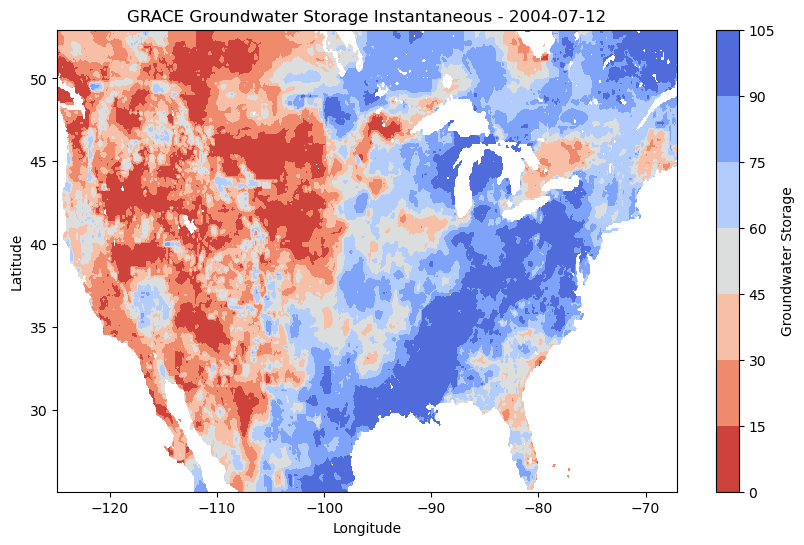

In [112]:
fig, ax = plt.subplots(figsize=(10, 6))
cb = None  # Colorbar placeholder

# Assuming 'lon' and 'lat' are 1D arrays
lon, lat = np.meshgrid(grace_data['lon'][:], grace_data['lat'][:])
dates = time2date(grace_data["time"])

index = 0

grace_day = grace_data['gws_inst'][index, :, :]
date = dates[index].strftime("%Y-%m-%d")
cont = plt.contourf(lon, lat, grace_day, cmap='coolwarm_r')
plt.colorbar(label='Groundwater Storage')
plt.title(f'GRACE Groundwater Storage Instantaneous - {date}')
plt.xlabel('Longitude')
plt.ylabel('Latitude')